In [7]:
import cv2
import os
import matplotlib.pyplot as plt
import random
import shutil
from PIL import Image
import numpy as np
import kagglehub

# Download the dataset
dataset_path = kagglehub.dataset_download("mdfahimbinamin/car-crash-or-collision-prediction-dataset")

if os.path.exists(dataset_path):
    print(f"Dataset downloaded to: {dataset_path}")
    # print("Contents of the dataset folder:")
    # for root, dirs, files in os.walk(dataset_path):
    #     print(f"Directory: {root}")
        # for file in files:
            # print(f"  - {file}")

# Find image files in the dataset path (including subdirectories)
image_files = []
for root, _, files in os.walk(dataset_path):
    for file in files:
        if file.endswith(('.jpg', '.png', '.jpeg')):
            image_files.append(os.path.join(root, file))

# Select a subset of 40–50 images
num_images_to_use = random.randint(40, 50)
selected_images = random.sample(image_files, min(num_images_to_use, len(image_files)))

# Optional: Copy selected images to a new folder for easier management
output_folder = "selected_images"
os.makedirs(output_folder, exist_ok=True)
for img_path in selected_images:
    img_filename = os.path.basename(img_path)
    shutil.copy(img_path, os.path.join(output_folder, img_filename))

# Load and preprocess the selected images without displaying them
image_data = []
for img_path in selected_images:
    try:
        img = Image.open(img_path).resize((224, 224))  # Resize to 224x224
        img_array = np.array(img) / 255.0  # Normalize pixel values
        image_data.append(img_array)
    except Exception as e:
        print(f"Error processing {img_path}: {e}")

print(f"Loaded {len(image_data)} images for training from {dataset_path}.")

Dataset downloaded to: /kaggle/input/car-crash-or-collision-prediction-dataset
Loaded 40 images for training from /kaggle/input/car-crash-or-collision-prediction-dataset.


In [8]:
# import cv2
# import os
# import matplotlib.pyplot as plt

# # Function to convert image to grayscale and RGB
# def process_image(image_path):
#     try:
#         img = cv2.imread(image_path)
#         gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#         rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#         return gray_img, rgb_img
#     except Exception as e:
#         print(f"Error processing image {image_path}: {e}")
#         return None, None

# # Use selected_images instead of image_data
# for img_path in selected_images:  # Iterate through the list of image paths
#     gray, rgb = process_image(img_path)

#     if gray is not None and rgb is not None:
#         plt.figure(figsize=(10, 5))
#         plt.subplot(1, 2, 1)
#         plt.imshow(gray, cmap='gray')
#         plt.title("Grayscale")
#         plt.subplot(1, 2, 2)
#         plt.imshow(rgb)
#         plt.title("RGB")
#         plt.show()

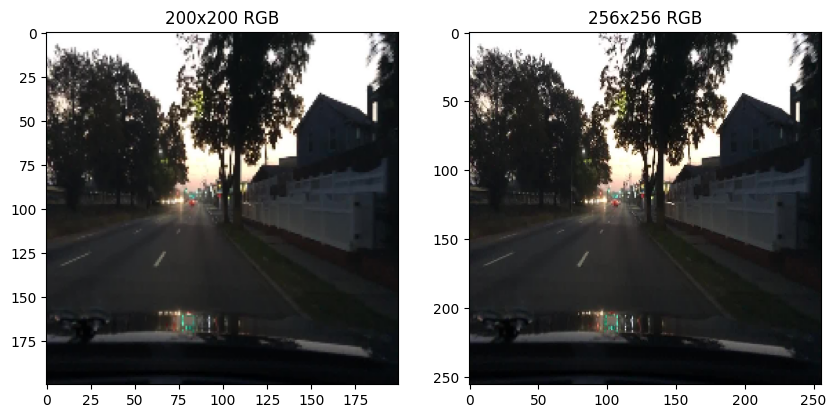

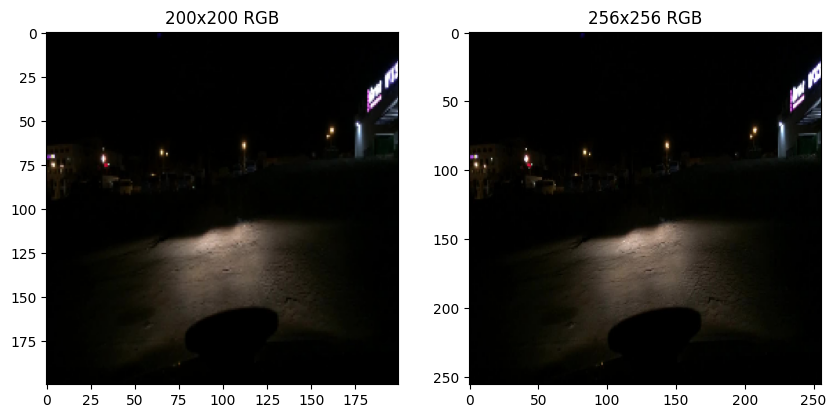

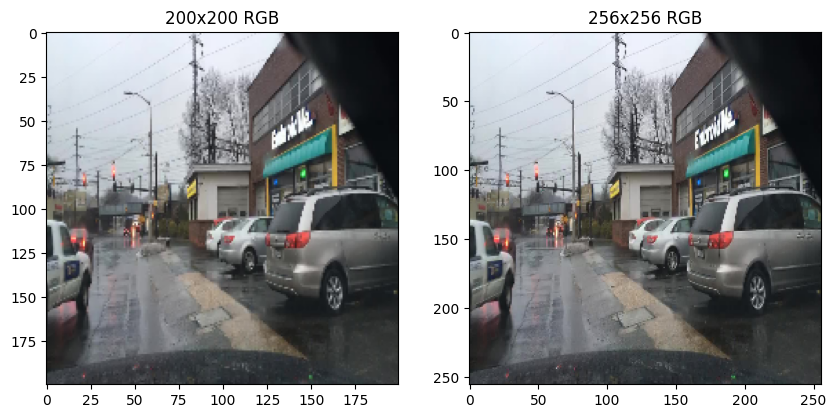

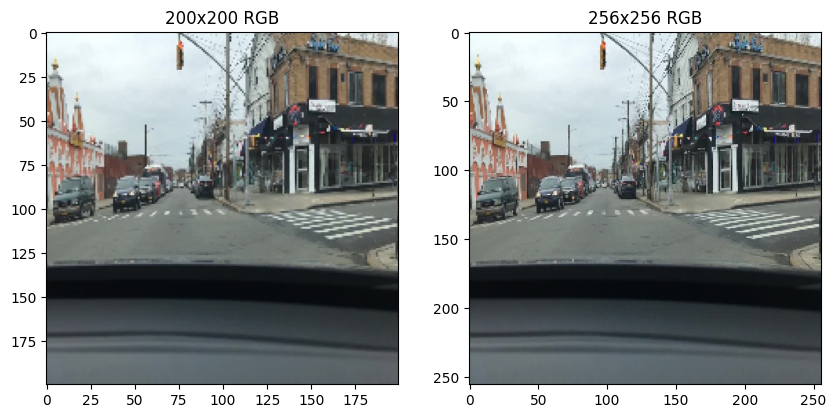

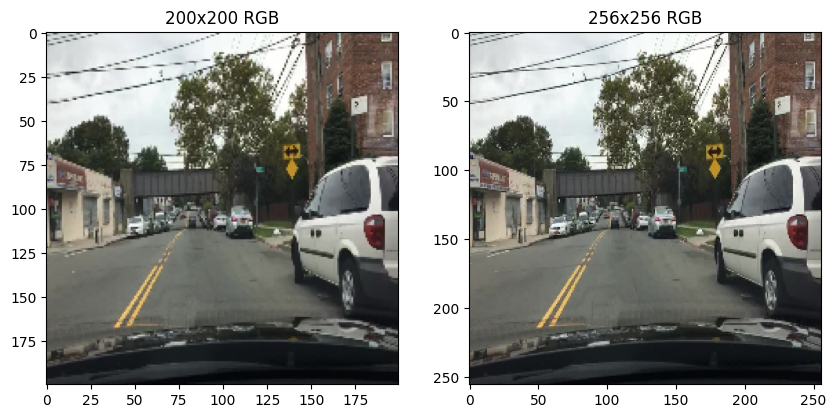

...

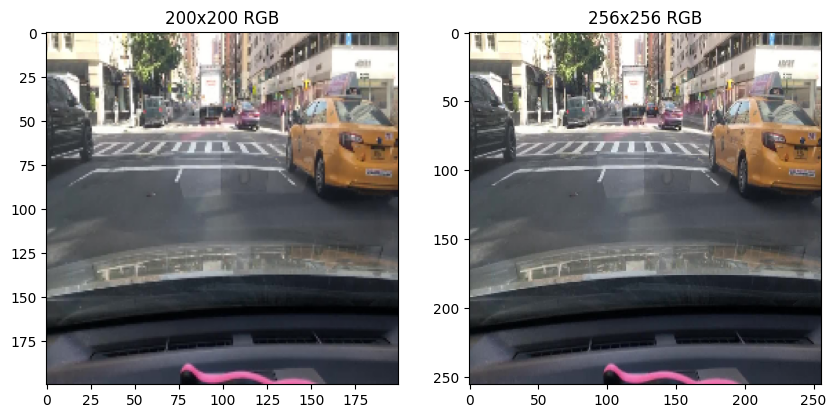

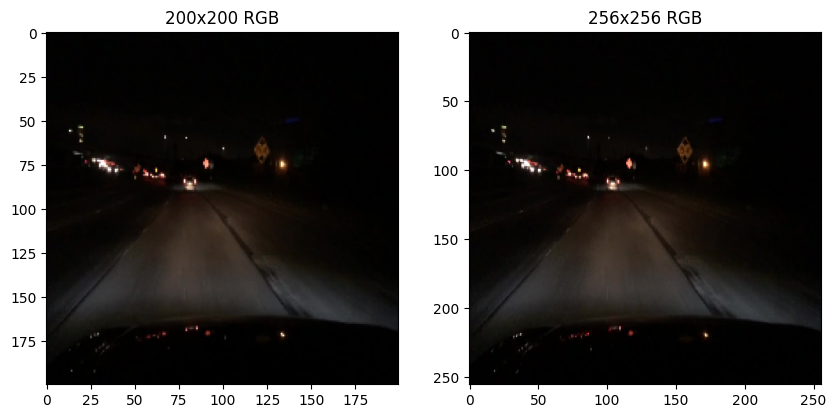

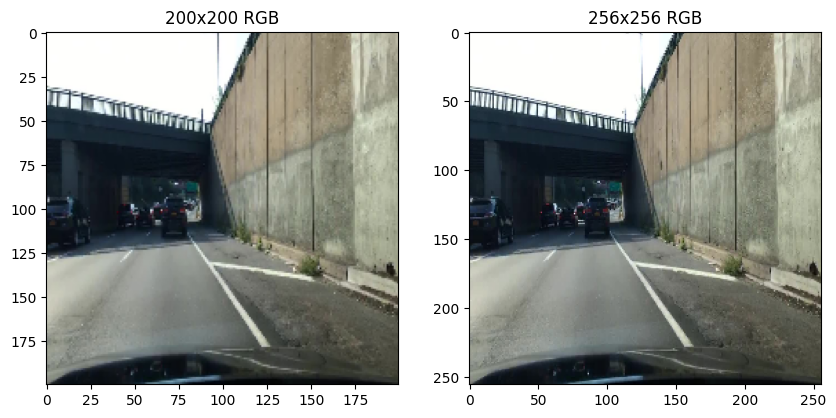

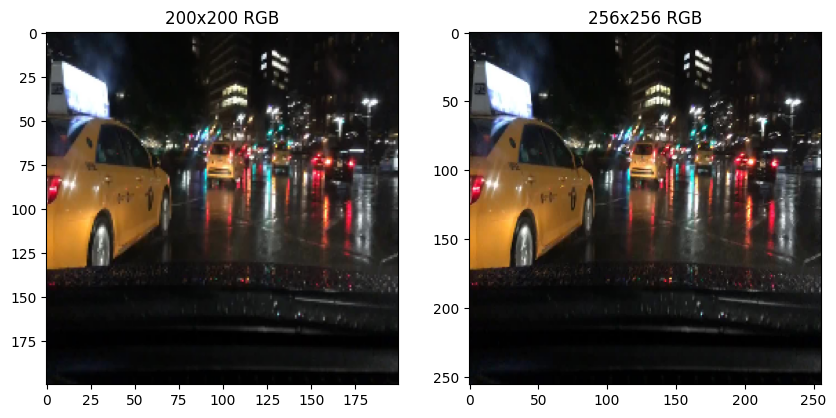

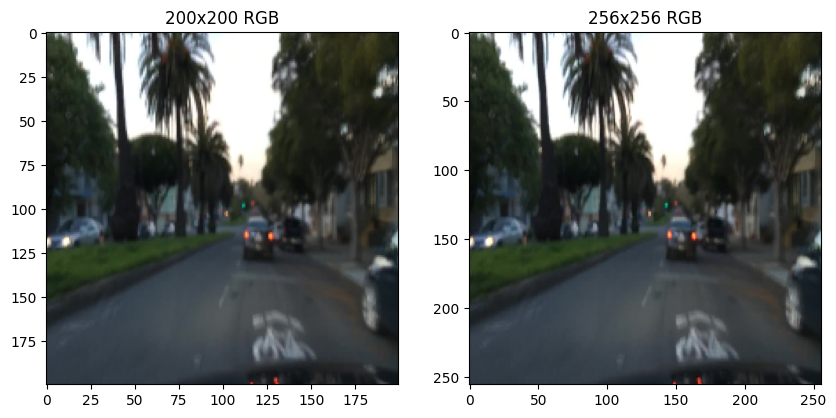

In [ ]:
def process_image(image_path):
    try:
        img = cv2.imread(image_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Resize to 200x200
        img_200 = cv2.resize(img_rgb, (200, 200))

        # Resize to 256x256
        img_256 = cv2.resize(img_rgb, (256, 256))

        return img_200, img_256
    except Exception as e:
        print(f"Error processing image {image_path}: {e}")
        return None, None

# Iterate directly through selected_images (list of file paths)
for image_path in selected_images:
    img_200, img_256 = process_image(image_path)

    if img_200 is not None and img_256 is not None:
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(img_200)
        plt.title("200x200 RGB")
        plt.subplot(1, 2, 2)
        plt.imshow(img_256)
        plt.title("256x256 RGB")
        plt.show()

In [ ]:
# Define dataset split (33% train, 33% val, 33% test)
split_ratio = [0.34, 0.33, 0.33]
train_split = int(split_ratio[0] * len(selected_images))
val_split = int(split_ratio[1] * len(selected_images))

train_images = selected_images[:train_split]
val_images = selected_images[train_split:train_split + val_split]
test_images = selected_images[train_split + val_split:]

# Create output directories
output_dirs = {
    "train": "dataset/train",
    "val": "dataset/val",
    "test": "dataset/test"
}

for _, path in output_dirs.items():
    os.makedirs(path, exist_ok=True)

# Function to copy images to respective directories
def copy_images(image_list, destination_folder):
    for img_path in image_list:
        img_filename = os.path.basename(img_path)
        shutil.copy(img_path, os.path.join(destination_folder, img_filename))

copy_images(train_images, output_dirs["train"])
copy_images(val_images, output_dirs["val"])
copy_images(test_images, output_dirs["test"])

print(f"Dataset spliting completed! \nTrain: {len(train_images)} images\nValidation: {len(val_images)} images\nTest: {len(test_images)} images.")


Dataset spliting completed! 
Train: 15 images
Validation: 14 images
Test: 16 images.


In [ ]:
import os
import shutil

train_dir = "dataset/train"
test_dir = "dataset/test"

# Create class folders (Modify class names based on your dataset)
os.makedirs(os.path.join(train_dir, "class1"), exist_ok=True)
os.makedirs(os.path.join(train_dir, "class2"), exist_ok=True)
os.makedirs(os.path.join(test_dir, "class1"), exist_ok=True)
os.makedirs(os.path.join(test_dir, "class2"), exist_ok=True)

# Move images into class folders (Here, randomly distributing them)
for img in os.listdir(train_dir):
    if img.endswith((".jpg", ".jpeg", ".png")):
        src_path = os.path.join(train_dir, img)
        dst_path = os.path.join(train_dir, "class1" if int(img.split(".")[0]) % 2 == 0 else "class2", img)
        shutil.move(src_path, dst_path)

for img in os.listdir(test_dir):
    if img.endswith((".jpg", ".jpeg", ".png")):
        src_path = os.path.join(test_dir, img)
        dst_path = os.path.join(test_dir, "class1" if int(img.split(".")[0]) % 2 == 0 else "class2", img)
        shutil.move(src_path, dst_path)

print("Dataset structure fixed!")


Dataset structure fixed!


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Set parameters
IMG_SIZE = (200, 200)  # Change to (256,256) if needed
COLOR_MODE = "rgb"  # Change to "grayscale" if needed
INPUT_SHAPE = (200, 200, 3) if COLOR_MODE == "rgb" else (200, 200, 1)
BATCH_SIZE = 32
EPOCHS = 10

# Data augmentation and loading
datagen = ImageDataGenerator(rescale=1.0/255.0, validation_split=0.2)

train_generator = datagen.flow_from_directory(
    "dataset/train",  # Verify this path is correct
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    color_mode=COLOR_MODE,
    subset="training"
)

val_generator = datagen.flow_from_directory(
    "dataset/train",  # Verify this path is correct
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    color_mode=COLOR_MODE,
    subset="validation"
)

test_generator = datagen.flow_from_directory(
    "dataset/test",  # Verify this path is correct
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    color_mode=COLOR_MODE,
    shuffle=False
)

# Build CNN model
model = Sequential([
    Conv2D(32, (3, 3), activation="relu", input_shape=INPUT_SHAPE),
    MaxPooling2D((2, 2)),

    Conv2D(64, (3, 3), activation="relu"),
    MaxPooling2D((2, 2)),

    Conv2D(128, (3, 3), activation="relu"),
    MaxPooling2D((2, 2)),

    Flatten(),
    Dense(128, activation="relu"),
    Dropout(0.5),
    Dense(train_generator.num_classes, activation="softmax")
])

# Compile model
model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])

# Train model
history = model.fit(train_generator, validation_data=val_generator, epochs=EPOCHS)

# Evaluate model
test_loss, test_acc = model.evaluate(test_generator)
print(f"Test Accuracy: {test_acc * 100:.2f}%")

# Save model
model.save("car_crash_cnn_model.h5")

Found 13 images belonging to 2 classes.
Found 2 images belonging to 2 classes.
Found 16 images belonging to 2 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - accuracy: 0.3846 - loss: 0.7110 - val_accuracy: 0.5000 - val_loss: 4.1731
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.6154 - loss: 2.8132 - val_accuracy: 0.5000 - val_loss: 0.8706
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - accuracy: 0.6154 - loss: 0.6111 - val_accuracy: 0.5000 - val_loss: 1.1890
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.4615 - loss: 0.8826 - val_accuracy: 0.5000 - val_loss: 0.6832
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - accuracy: 0.6923 - loss: 0.5744 - val_accuracy: 0.5000 - val_loss: 1.1432
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - accuracy: 0.6923 - loss: 0.5468 - val_accuracy: 0.5000 - val_loss: 0.9533
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.7692 - loss: 0.4091 - val_accuracy: 0.5000 - val_loss: 0.8823
Epoch 8/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.9231 - loss: 0.2902 - val_accuracy: 0.0000e+00 - val_loss: 0.9137
Epoch 9/10
1/1 ━━━━━━━━

Test Accuracy: 56.25%


In [ ]:
from scipy import stats
train_accuracies = history.history['accuracy']
val_accuracies = history.history['val_accuracy']

train_losses = history.history['loss']
val_losses = history.history['val_loss']

train_accuracies = np.array(train_accuracies)
val_accuracies = np.array(val_accuracies)

# Perform Z-test (assuming large sample size and known variances)
z_score, p_value_z = stats.ttest_ind(train_accuracies, val_accuracies, equal_var=True)
print(f"\nZ-test Results:\nZ-score = {z_score}\nP-value = {p_value_z}")

# Perform T-test (assuming small sample size or unknown variances)
t_score, p_value_t = stats.ttest_ind(train_accuracies, val_accuracies, equal_var=False)
print(f"\nT-test Results:\nT-score = {t_score}\nP-value = {p_value_t}")

chi2_statistic, p_value_chi2, _, _ = stats.chi2_contingency([train_accuracies, val_accuracies])
print(f"\nChi-Square Test Results:\nChi2 Statistic = {chi2_statistic}\nP-value = {p_value_chi2}")


Z-test Results:
Z-score = 3.3389906761818895
P-value = 0.0036527609306954605

T-test Results:
T-score = 3.33899067618189
P-value = 0.0036528144280139683

Chi-Square Test Results:
Chi2 Statistic = 1.4755454405605242
P-value = 0.9973241529012351


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# Get predictions on the test set
predictions = model.predict(test_generator)
y_pred = np.argmax(predictions, axis=1)
y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

# Print classification report
report = classification_report(y_true, y_pred, target_names=class_labels)
print("Classification Report:\n")
print(report)

# Optional: Display confusion matrix
cm = confusion_matrix(y_true, y_pred)
cm


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 759ms/step
Classification Report:

              precision    recall  f1-score   support

      class1       0.62      0.80      0.70        10
      class2       0.33      0.17      0.22         6

    accuracy                           0.56        16
   macro avg       0.47      0.48      0.46        16
weighted avg       0.51      0.56      0.52        16



array([[8, 2],
       [5, 1]])

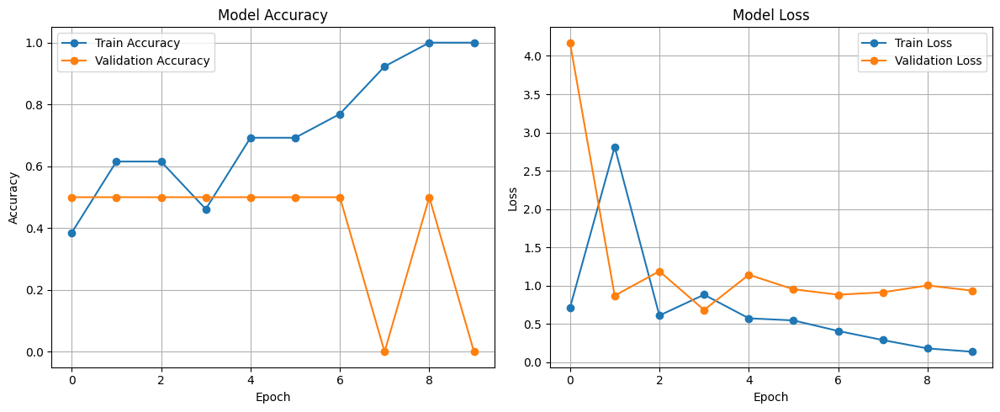

In [ ]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy', marker='o')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss', marker='o')
plt.plot(history.history['val_loss'], label='Validation Loss', marker='o')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


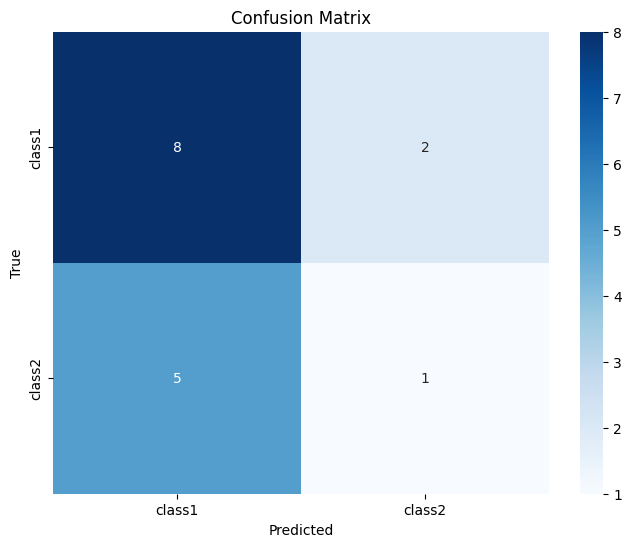

In [ ]:
# prompt: plot confusion matrix

import seaborn as sns
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()


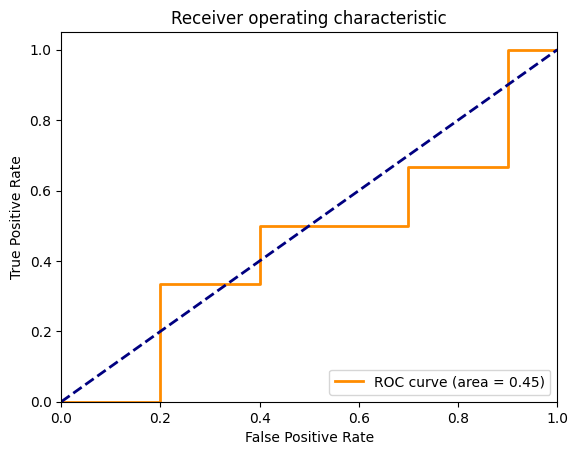

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

y_scores = predictions[:, 1]
# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_true, y_scores)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()
